In [1]:
# Specify visible cuda device
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [14]:
%matplotlib inline

%reload_ext autoreload
%autoreload 2

import pickle
from parameters import *
from lib.utils import *
from lib.attacks import *
from lib.keras_utils import *
from lib.RandomTransform import *
from lib.OptCarlini import *
from lib.OptTransform import *
from lib.OptProjTran import *

In [3]:
# Build and load trained model
model = build_mltscl()
#model = build_cnn()
model.load_weights(WEIGTHS_PATH)

# Load dataset
x_train, y_train, x_val, y_val, x_test, y_test = load_dataset_GTSRB(
    n_channel=N_CHANNEL)

y_train = keras.utils.to_categorical(y_train, NUM_LABELS)
y_test = keras.utils.to_categorical(y_test, NUM_LABELS)
y_val = keras.utils.to_categorical(y_val, NUM_LABELS)

# Read sign names
signnames = read_csv("./input_data/signnames.csv").values[:, 1]

In [4]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 32)   2432        input_1[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 32, 32, 32)   0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 16, 16, 32)   0           dropout_1[0][0]                  
__________________________________________________________________________________________________
conv2d_2 (

### Run Attacks

In [5]:
SAMPLE_IMG_DIR = './test_attack_1/original/'
SAMPLE_LABEL = './test_attack_1/original/labels.txt'

Load samples 

In [6]:
# Load sample images and labels
del_id = [3, 8, 9, 10, 14]
x_smp, x_smp_full, y_smp, masks, masks_full = load_samples(
    SAMPLE_IMG_DIR, SAMPLE_LABEL)
x_smp = np.delete(x_smp, del_id, axis=0)
x_smp_full = np.delete(x_smp_full, del_id, axis=0)
y_smp = np.delete(y_smp, del_id, axis=0)
masks = np.delete(masks, del_id, axis=0)
masks_full = np.delete(masks_full, del_id, axis=0)

Specify target classes

In [7]:
y_target = np.array([3, 20, 42, 38,  1, 22, 24,  6, 13,  8, 29, 14, 41, 37,  7,
                     32, 19, 21,  9, 26])
y_tg = keras.utils.to_categorical(y_target, NUM_LABELS)

Double-check that images are read and classified correctly. Also make sure that masks are generated appropriately.

0
Speed limit (30km/h)  Speed limit (30km/h)


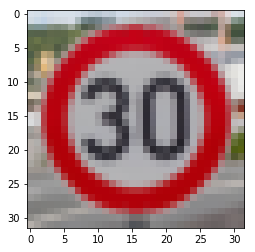

1
No entry  No entry


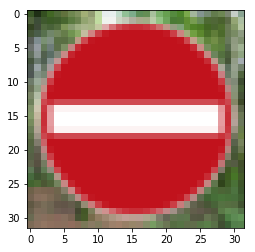

2
Turn right ahead  Turn right ahead


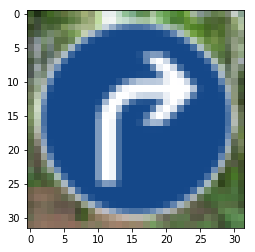

3
No vechiles  No vechiles


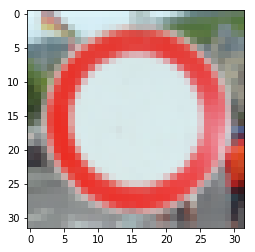

4
Speed limit (60km/h)  Speed limit (60km/h)


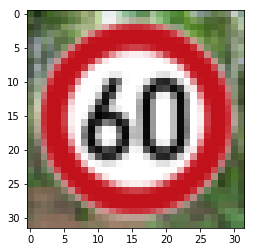

5
Keep left  Keep left


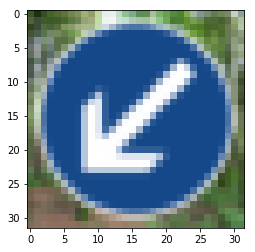

6
Vechiles over 3.5 metric tons prohibited  Vechiles over 3.5 metric tons prohibited


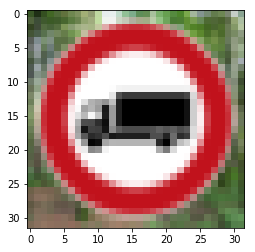

7
Speed limit (100km/h)  Speed limit (100km/h)


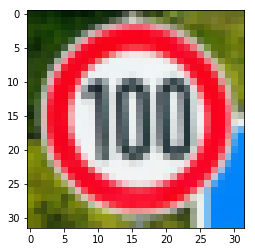

8
No passing  No passing


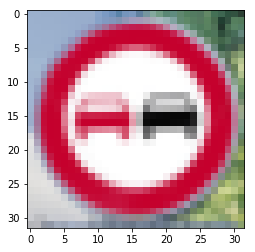

9
Stop  Stop


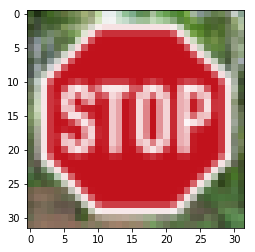

10
Roundabout mandatory  Roundabout mandatory


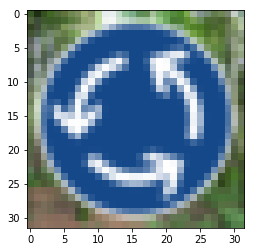

11
No passing for vechiles over 3.5 metric tons  No passing for vechiles over 3.5 metric tons


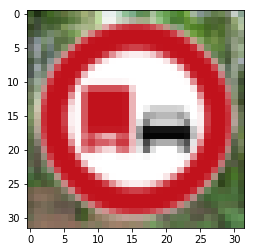

12
General caution  General caution


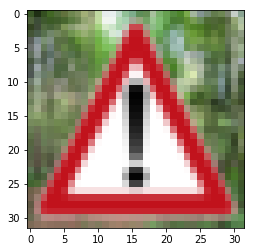

13
Right-of-way at the next intersection  Right-of-way at the next intersection


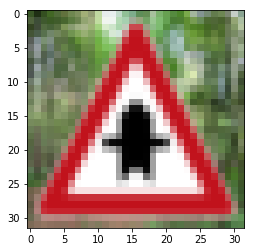

14
Speed limit (50km/h)  Speed limit (50km/h)


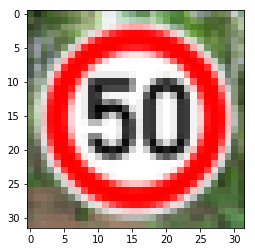

15
Dangerous curve to the right  Dangerous curve to the right


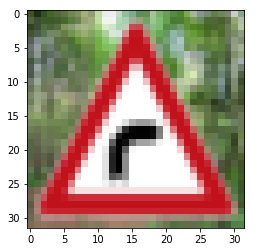

16
End of all speed and passing limits  End of all speed and passing limits


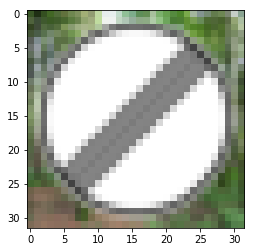

17
Speed limit (120km/h)  Speed limit (120km/h)


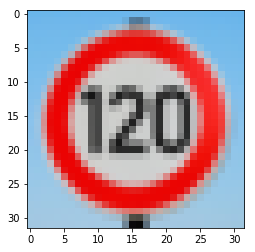

18
Speed limit (80km/h)  Speed limit (80km/h)


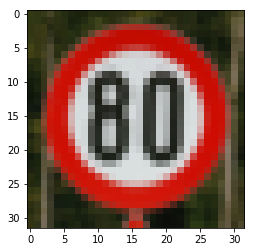

19
Ahead only  Ahead only


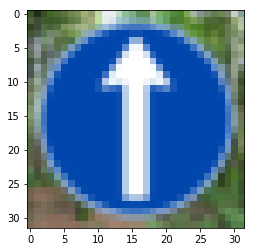

20
Bicycles crossing  Bicycles crossing


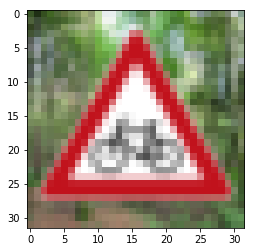

21
End of no passing  End of no passing


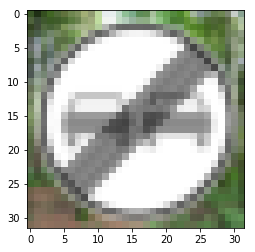

In [8]:
for i, im in enumerate(x_smp):
    print(i)
    print(signnames[predict(model, im)] + "  " + signnames[np.argmax(y_smp[i])])
    plt.imshow(im)
    plt.show()

Utility method for quick check on jupyter notebook

In [9]:
def test_tran(im_full, model):
    """Get predicted labels from a 10 randomly transformed im_full"""
    
    rnd_transform = RandomTransform(p=1.0, intensity=0.3)
    out = []
    
    for i in range(10):
        tmp = rnd_transform.transform(im_full)
        tmp = random_brightness(tmp, delta=0.3)
        resized_im = resize(tmp, (HEIGHT, WIDTH), interp="bilinear")
        out.append(signnames[predict(model, resized_im)])
        
    print(out)
    return out

What random transformation and enhancement look like

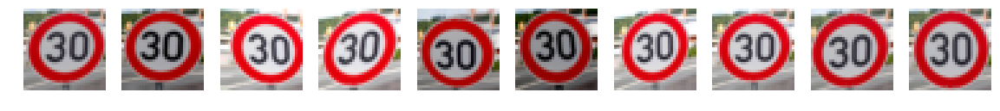

In [10]:
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(20,5))

seed = 1111
rnd_transform = RandomTransform(seed=seed, p=1.0, intensity=0.3)

for col in ax:
    tmp = rnd_transform.transform(x_smp_full[0])
    tmp = random_brightness(tmp, delta=0.3)
    im_t = random_resize(tmp)
    col.imshow(im_t)
    col.axis("off")

### OptProjTran

`OptProjTran` is our main attack function. Usage example is the following.

In [11]:
sp_size = np.repeat(np.random.randint(20, 600, 128), 2).reshape(128, 2)

opt = OptProjTran(model, c=0.2, lr=0.02, target=True, use_bound=False,
                  init_scl=0.1, loss_op=0, var_change=True, use_mask=True,
                  k=100, batch_size=128, decay=False, p_norm="1",
                  l=30, sp_size=sp_size, rnd_tran=INT_TRN,
                  rnd_bri=DELTA_BRI, c_smooth=0)

outputs = []
norms = []

for i, x in enumerate(x_smp):
    print(i)
    x_adv, norm = opt.optimize(x, y_tg[i], n_step=2000, prog=True, mask=masks[i])
    outputs.append(x_adv)
    norms.append(norm)

0
Step: 0, norm=0.874, loss=77.377, smooth=1.367, obj=2.422
Step: 200, norm=0.818, loss=14.268, smooth=0.455, obj=1.103
Step: 400, norm=0.818, loss=14.262, smooth=0.455, obj=1.103
Step: 600, norm=0.817, loss=14.273, smooth=0.454, obj=1.103
Step: 800, norm=0.819, loss=14.221, smooth=0.456, obj=1.103
Step: 1000, norm=0.818, loss=14.242, smooth=0.455, obj=1.103
Step: 1200, norm=0.818, loss=14.256, smooth=0.454, obj=1.103
Step: 1400, norm=0.817, loss=14.274, smooth=0.454, obj=1.103
Step: 1600, norm=0.819, loss=14.222, smooth=0.455, obj=1.103
Step: 1800, norm=0.817, loss=14.287, smooth=0.454, obj=1.103
1
Step: 0, norm=0.595, loss=296.578, smooth=0.711, obj=6.527
Step: 200, norm=2.787, loss=20.905, smooth=6.160, obj=3.205
Step: 400, norm=2.787, loss=20.820, smooth=6.170, obj=3.204
Step: 600, norm=2.786, loss=20.848, smooth=6.166, obj=3.203
Step: 800, norm=2.785, loss=20.876, smooth=6.164, obj=3.203
Step: 1000, norm=2.786, loss=20.842, smooth=6.168, obj=3.203
Step: 1200, norm=2.786, loss=20.8

Step: 1200, norm=1.629, loss=25.890, smooth=1.852, obj=2.146
Step: 1400, norm=1.629, loss=25.893, smooth=1.852, obj=2.146
Step: 1600, norm=1.627, loss=25.947, smooth=1.850, obj=2.146
Step: 1800, norm=1.628, loss=25.913, smooth=1.852, obj=2.146
14
Step: 0, norm=0.455, loss=80.373, smooth=0.393, obj=2.062
Step: 200, norm=0.771, loss=32.294, smooth=0.435, obj=1.416
Step: 400, norm=0.771, loss=32.221, smooth=0.436, obj=1.416
Step: 600, norm=0.772, loss=32.158, smooth=0.437, obj=1.416
Step: 800, norm=0.773, loss=32.137, smooth=0.438, obj=1.415
Step: 1000, norm=0.773, loss=32.119, smooth=0.438, obj=1.415
Step: 1200, norm=0.773, loss=32.116, smooth=0.438, obj=1.415
Step: 1400, norm=0.774, loss=32.088, smooth=0.439, obj=1.415
Step: 1600, norm=0.774, loss=32.081, smooth=0.439, obj=1.415
Step: 1800, norm=0.774, loss=32.090, smooth=0.439, obj=1.415
15
Step: 0, norm=0.524, loss=93.791, smooth=0.548, obj=2.400
Step: 200, norm=0.948, loss=21.132, smooth=0.812, obj=1.370
Step: 400, norm=0.947, loss=2

IndexError: index 20 is out of bounds for axis 0 with size 20

### Iterative method with transformation

`iter_transform` is a gradient descent method that incorporates masks and random transformation of the input sample.

In [ ]:
outputs = []
losses = []

for i, x in enumerate(x_ben):
    print(i)
    x_adv, loss = iter_transform(model, x, y_tg[i], norm="inf", n_step=200, step_size=0.001, 
                                 target=True, mask=masks_ben[i], batch_size=128)
    outputs.append(x_adv)
    losses.append(loss)

### Virtual Testing

Test generated adversarial examples virtually

In [12]:
# Resize generated perturbation and add to the full-sized image

outputs_full = []

for i, x in enumerate(outputs):
    
    ptb = x - x_smp[i]
    ptb = cv2.resize(ptb, (x_smp_full[i].shape[1], x_smp_full[i].shape[0]), 
                     interpolation=cv2.INTER_NEAREST)
    out_full = x_smp_full[i] + ptb
    out_full = np.clip(out_full, 0, 1)
    outputs_full.append(out_full)

0
Classified label: Speed limit (30km/h)
Norm of the perturbation: 0.818573
['Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (20km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (120km/h)']


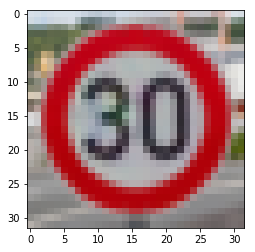

1
Classified label: No entry
Norm of the perturbation: 2.78543
['No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'Stop', 'No entry', 'No entry', 'No entry', 'No entry']


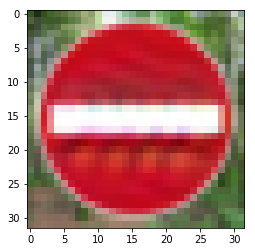

2
Classified label: Turn right ahead
Norm of the perturbation: 1.3104
['Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Go straight or right', 'Turn right ahead']


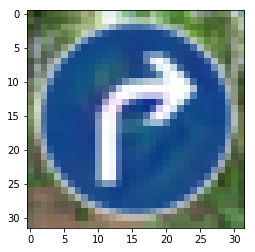

3
Classified label: No vechiles
Norm of the perturbation: 0.314972
['No vechiles', 'No vechiles', 'No vechiles', 'No vechiles', 'No vechiles', 'No vechiles', 'Speed limit (70km/h)', 'No vechiles', 'No vechiles', 'No vechiles']


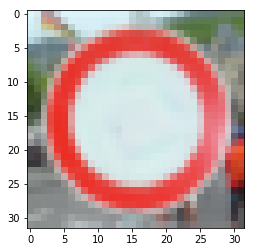

4
Classified label: Speed limit (60km/h)
Norm of the perturbation: 0.389626
['Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (30km/h)']


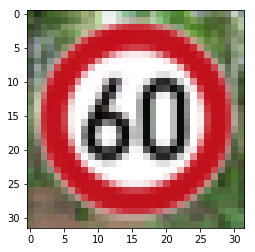

5
Classified label: Keep left
Norm of the perturbation: 1.79794
['Keep left', 'Keep left', 'Keep left', 'Keep left', 'Keep left', 'Keep left', 'Keep left', 'Keep left', 'Keep left', 'Keep left']


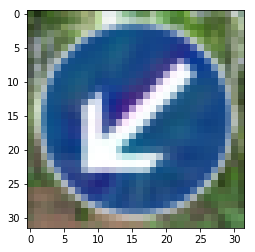

6
Classified label: Vechiles over 3.5 metric tons prohibited
Norm of the perturbation: 2.41486
['Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited']


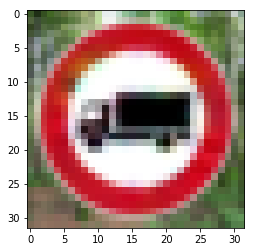

7
Classified label: Speed limit (20km/h)
Norm of the perturbation: 0.782481
['Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (20km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (100km/h)']


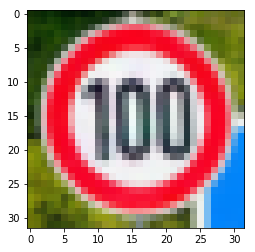

8
Classified label: No passing
Norm of the perturbation: 1.50184
['No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing']


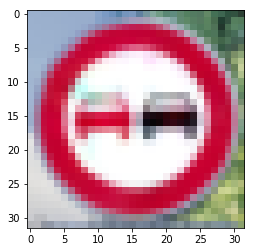

9
Classified label: Stop
Norm of the perturbation: 2.67029
['Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop']


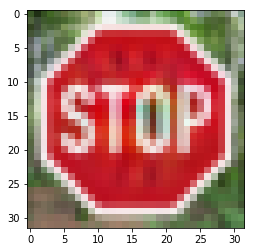

10
Classified label: Roundabout mandatory
Norm of the perturbation: 1.46627
['Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory', 'Roundabout mandatory']


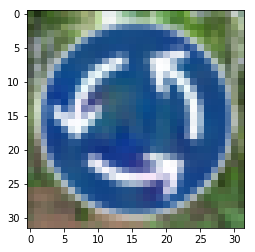

11
Classified label: No passing for vechiles over 3.5 metric tons
Norm of the perturbation: 1.53044
['No passing for vechiles over 3.5 metric tons', 'No passing for vechiles over 3.5 metric tons', 'No passing for vechiles over 3.5 metric tons', 'No passing for vechiles over 3.5 metric tons', 'No passing for vechiles over 3.5 metric tons', 'No passing for vechiles over 3.5 metric tons', 'No passing for vechiles over 3.5 metric tons', 'No passing for vechiles over 3.5 metric tons', 'No passing', 'No passing for vechiles over 3.5 metric tons']


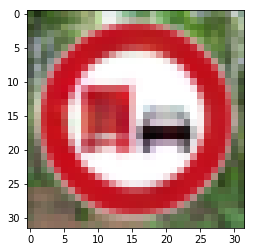

12
Classified label: General caution
Norm of the perturbation: 1.52841
['General caution', 'General caution', 'General caution', 'General caution', 'General caution', 'General caution', 'General caution', 'General caution', 'General caution', 'General caution']


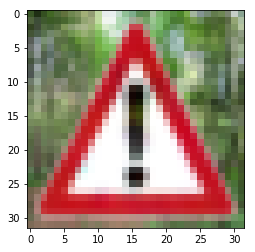

13
Classified label: Right-of-way at the next intersection
Norm of the perturbation: 1.62829
['Dangerous curve to the left', 'Pedestrians', 'Right-of-way at the next intersection', 'Right-of-way at the next intersection', 'Right-of-way at the next intersection', 'Dangerous curve to the left', 'Right-of-way at the next intersection', 'Right-of-way at the next intersection', 'Right-of-way at the next intersection', 'Right-of-way at the next intersection']


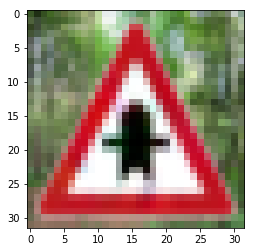

14
Classified label: Speed limit (50km/h)
Norm of the perturbation: 0.773369
['Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)', 'Speed limit (50km/h)']


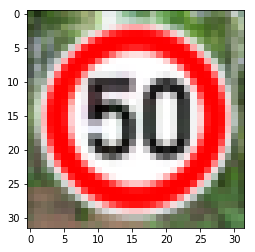

15
Classified label: Dangerous curve to the right
Norm of the perturbation: 0.947889
['Vechiles over 3.5 metric tons prohibited', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Vechiles over 3.5 metric tons prohibited']


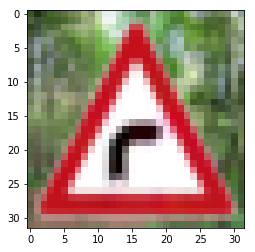

16
Classified label: End of all speed and passing limits
Norm of the perturbation: 0.673813
['End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'Yield', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits']


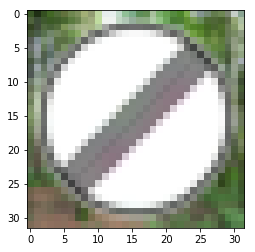

17
Classified label: Speed limit (120km/h)
Norm of the perturbation: 0.740346
['Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (20km/h)', 'Speed limit (20km/h)', 'Speed limit (100km/h)', 'Speed limit (20km/h)', 'Speed limit (100km/h)', 'Speed limit (20km/h)', 'Speed limit (20km/h)']


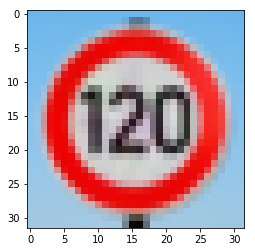

18
Classified label: Speed limit (80km/h)
Norm of the perturbation: 0.2
['No entry', 'Speed limit (80km/h)', 'Speed limit (80km/h)', 'Speed limit (80km/h)', 'Speed limit (80km/h)', 'Speed limit (80km/h)', 'Speed limit (80km/h)', 'Keep left', 'Speed limit (80km/h)', 'Speed limit (80km/h)']


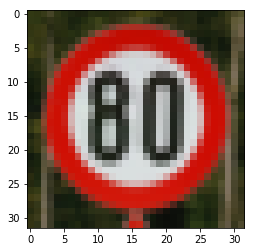

19
Classified label: Ahead only
Norm of the perturbation: 1.17524
['Ahead only', 'Ahead only', 'Ahead only', 'Turn left ahead', 'Ahead only', 'Ahead only', 'Ahead only', 'Keep left', 'Ahead only', 'Roundabout mandatory']


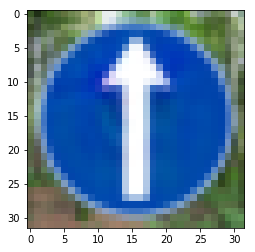

In [13]:
# Print predicted labels before and after virtual image transformation

for i, x in enumerate(outputs_full):
    print(i)
    resized_im = resize(x, (32, 32), interp="bilinear")
    print("Classified label: " + signnames[predict(model, resized_im)])
    print("Norm of the perturbation: " + str(norms[i]))
    test_tran(x, model)
    plt.imshow(resized_im)
    plt.show()

### Load generated samples for testing

Calculate success rate

In [26]:
# Code snippet to load outputs generated from OptProjTran
alg = "opt_proj"
ind = "20"

outputs = []
norms = []
for i in range(20):
    fname = "{}_{}_{}.p".format(alg, ind, i)
    outputs.append(pickle.load(open("./save/outputs_" + fname, "rb")))
    norms.extend(pickle.load(open("./save/norms_" + fname, "rb")))

In [12]:
suc_rate = []
norm_all = []

# Specify indices of saved output
for ind in range(0, 10):
    alg = "opt_proj"

    # Load saved adversarial examples to list
    outputs = []
    norms = []
    for i in range(20):
        fname = "{}_{}_{}.p".format(alg, ind, i)
        outputs.append(pickle.load(open("./save/outputs_" + fname, "rb")))
        norms.extend(pickle.load(open("./save/norms_" + fname, "rb")))
       
    # Rearrange samples for evaluation function
    x_adv = []
    y_target = []
    y_orig = []
    x_orig = []
    x_orig_full = []

    for i, o in enumerate(outputs):
        j = 0
        for x in o:
            if np.argmax(y_smp[i]) == np.argmax(y_tg[j]):
                j += 1
            x_adv.append(x)
            y_target.append(y_tg[j])
            y_orig.append(y_smp[i])
            x_orig.append(x_smp[i])
            x_orig_full.append(x_smp_full[i])
            j += 1

    x_adv = np.array(x_adv)
    y_target = np.array(y_target)
    y_orig = np.array(y_orig)
    x_orig = np.array(x_orig)
    x_orig_full = np.array(x_orig_full)

    # Start evaluation
    suc, c_adv, c_orig = evaluate_adv(model, x_adv, y_target, x_orig, 
        y_smp=y_orig, target=True, x_smp_full=x_orig_full, tran=False)
    suc_rate.append(suc)
    norm_all.append(norms)
    
    print(np.mean(norms))
    print(suc)

Visualize load samples

In [27]:
outputs_full = []

for i, o in enumerate(outputs):
    outs_full = []
    for j, x in enumerate(o):
        ptb = x - x_smp[i]
        ptb = cv2.resize(ptb, (x_smp_full[i].shape[1], x_smp_full[i].shape[0]), 
                         interpolation=cv2.INTER_LINEAR)
        out_full = x_smp_full[i] + ptb
        out_full = np.clip(out_full, 0, 1)
        outs_full.append(out_full)
    outputs_full.append(outs_full)

In [ ]:
for i, o in enumerate(outputs_full):
    j = 0
    for _, x in enumerate(o):
        if np.argmax(y_smp[i]) == np.argmax(y_tg[j]):
            j += 1
        print("Sample: " + str(i) + ", Label: " + str(j))
        resized_im = resize(x, (32, 32), interp="bilinear")
        print("Classified label: " + signnames[predict(model, resized_im)] + "  <------- Target: " 
              + signnames[np.argmax(y_tg[j])])
        print(norms[i])
        test_tran(x, model)
        plt.imshow(resized_im)
        plt.show()
        j += 1

---
### Test on physical examples

The code below contains all functions that implement the traffic sign recognition pipeline (the classifier must be loaded previously as `model`). Note that the detector only detects circular traffic signs as it uses Circle Hough Transform. 

In [21]:
CONF_THRES = 0.95   # Threshold for confidence score
IOU_THRES = 0.5     # Threshold for IoU for evaluating detector
# Labels of circlur signs
cir_cls = [0,1,2,3,4,5,6,7,8,9,10,15,16,17,32,33,34,35,36,37,38,39,40,41,42]


def bb_iou(boxA, boxB):
    """
    Calculate IoU from two bounding boxes. Code adapted from:
    https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/
    """
    
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
 
    # compute the area of intersection rectangle
    interArea = (xB - xA + 1) * (yB - yA + 1)
 
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
 
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
 
    # return the intersection over union value
    return iou


def read_bb(filename):
    """Read ground truth bounding boxes from file"""
    
    gt_bboxes = {}
    with open(filename) as file:
        for line in file:
            frame = str(int(line.strip().split(".")[0]))
            bb = line.strip().split(";")[1:6]
            bb = list(map(int, bb))
            if frame in gt_bboxes:
                gt_bboxes[frame].append(bb)
            else:
                gt_bboxes[frame] = [bb]
    return gt_bboxes


def find_circles(img, mg_ratio=0.4, n_circles=1):
    """
    Find circular objects and return bounding boxes in the format
    [x1, y1, x2, y2]
    """
    
    targetImg = np.copy(img)
    targetImg = np.uint8(targetImg * 255)
    # Apply Gaussian blur if needed
    n = 9
    targetImg = cv2.GaussianBlur(targetImg, (n, n), 0)
    
    # Resize image to 
    #targetImg = imutils.resize(targetImg, width=w)
    # Convert to grayscale
    grayImg = np.uint8(rgb2gray(targetImg))
    # param1 is canny threshold, param2 is circle accumulator threshold
    circles = cv2.HoughCircles(grayImg, cv2.HOUGH_GRADIENT, 1, 200,
                               param1=50, param2=30, minRadius=5, 
                               maxRadius=100)
    
    bboxes = []
    try:
        cir = circles.astype(np.uint16)
        for c in cir[0, :n_circles]:
            r = int(c[2])
            mg = int(r * mg_ratio)
            bboxes.append([c[0]-r-mg, c[1]-r-mg, c[0]+r+mg, c[1]+r+mg])
    except AttributeError:
        pass
    except:
        raise
    return bboxes


def draw_bb(img, bbox, color=(0,1,0)):
    """Draw bounding box"""
    cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), 
                  color, 2)
    return img


def crop_bb(img, bbox):
    """Crop image by specifying bounding box"""
    bb = np.array(bbox)
    bb = bb * (bb > 0)
    return img[bb[1]:bb[3], bb[0]:bb[2], :]


def detect(model, im):
    """Run detection, returns bounding box"""
    
    img = np.copy(im)
    bboxes = find_circles(img, mg_ratio=0.4, n_circles=3)
    bb = []
    for bbox in bboxes:
        crop = crop_bb(im, bbox)
        resized_im = resize(crop)
        y_pred = predict(model, resized_im)
        conf = np.max(softmax(model.predict(resized_im.reshape(INPUT_SHAPE))[0]))
        # Consider detection only if confidence is larger than threshold
        if conf > CONF_THRES:
            bbox.append(y_pred)
            bb.append(bbox)
    return bb


def detect_draw(model, im, gt=None):
    """
    Run detection on single image and draw bounding boxes, labels, and
    confidence scores
    """
    
    img = np.copy(im)
    bboxes = find_circles(img, mg_ratio=0.4, n_circles=3)
    for bbox in bboxes:
        crop = crop_bb(im, bbox)
        resized_im = resize(crop)
        label = signnames[predict(model, resized_im)]
        conf = np.max(softmax(model.predict(resized_im.reshape(INPUT_SHAPE))[0]))
        # Consider detection only if confidence is larger than threshold
        if conf > CONF_THRES:
            img = draw_bb(img, bbox)
            # Put label and confidence
            cv2.putText(img, '{}: {:.2f}'.format(label, conf), (bbox[0],bbox[1]-10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (0,1,0), 2)
        else:
            print('{}: {:.2f}'.format(label, conf))
            
    # Draw ground truth
    if gt is not None:
        for bb in gt:
            img = draw_bb(img, bb, color=(0,0,1))
            cv2.putText(img, signnames[bb[4]], (bb[0],bb[1]-10), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,1), 2)

    plt.figure(figsize=(16,9))
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    
    
def detect_mAP(model, images, gt_bboxes):
    """Run detection and evaluate mAP"""
    
    n_pos = np.zeros(NUM_LABELS)
    n_tp = np.zeros(NUM_LABELS)
    
    for i, im in enumerate(images):
        if str(i) not in gt_bboxes:
            continue
        bboxes = detect(model, im)
        for bbox in bboxes:
            y_pred = bbox[4]
            n_pos[y_pred] += 1
            # Check the detected bb against all ground truth bb's
            for bb in gt_bboxes[str(i)]:
                if y_pred == bb[4] and bb_iou(bb, bbox) > IOU_THRES:
                    n_tp[y_pred] += 1
                    break
                        
    return n_tp, n_pos

In [22]:
TARGET_DIR = "./input_data/FullIJCNN2013/"

gt_bboxes = read_bb(TARGET_DIR + "gt.txt")
images = read_images(TARGET_DIR)

End of no passing by vechiles over 3.5 metric tons: 0.94
Yield: 0.09
Speed limit (30km/h): 0.09


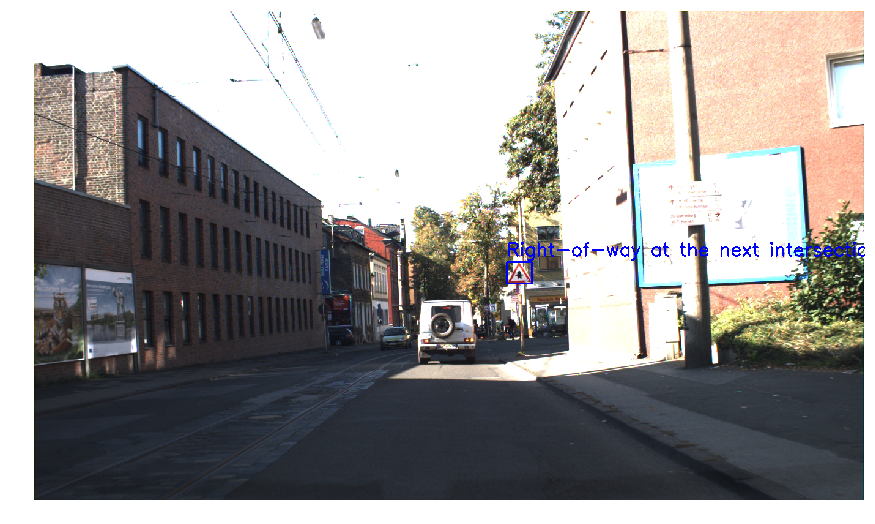

Yield: 0.16


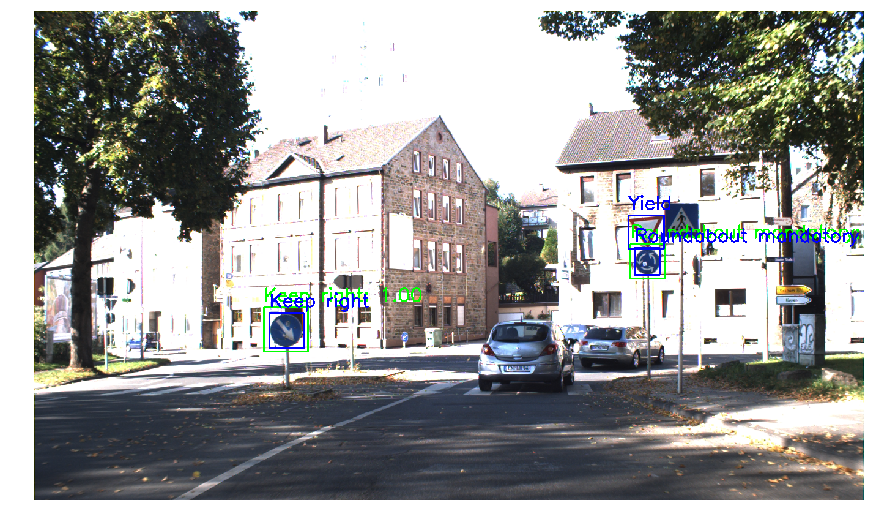

Speed limit (60km/h): 0.12
End of speed limit (80km/h): 0.08
Bicycles crossing: 0.32


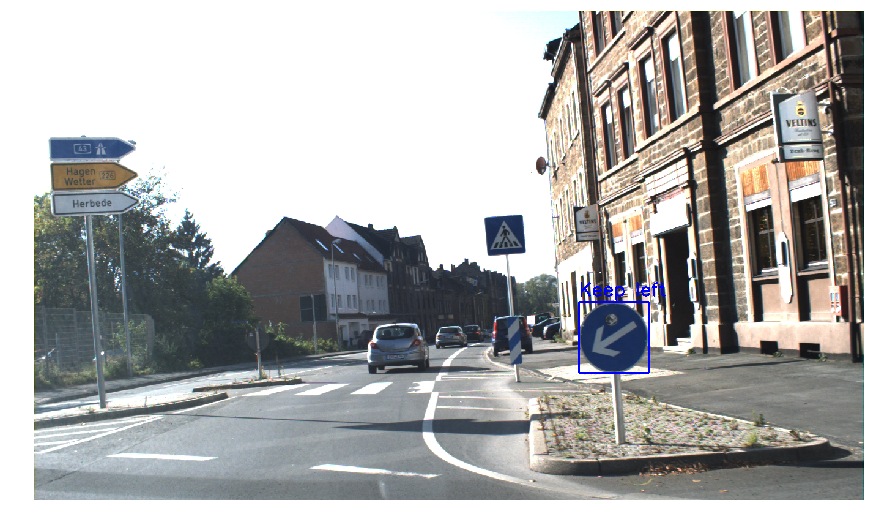

Bicycles crossing: 0.29
Yield: 0.26
Yield: 0.36


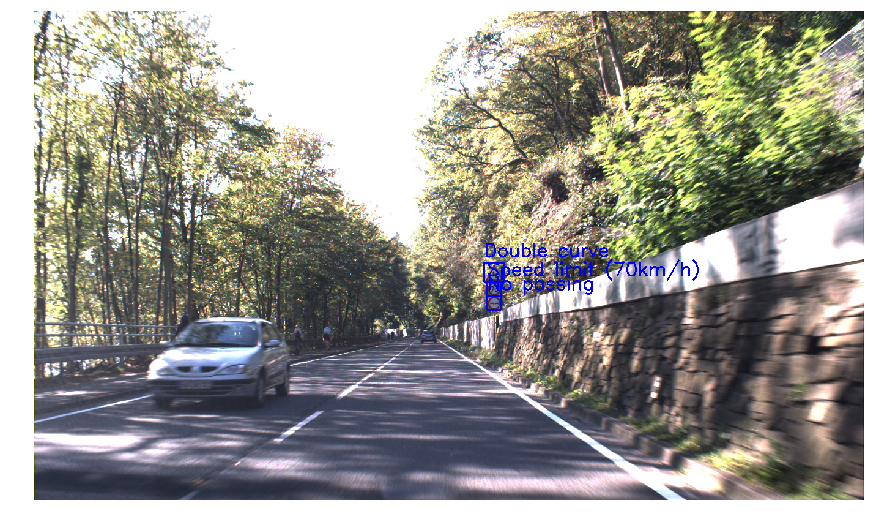

Speed limit (60km/h): 0.08
Yield: 0.20


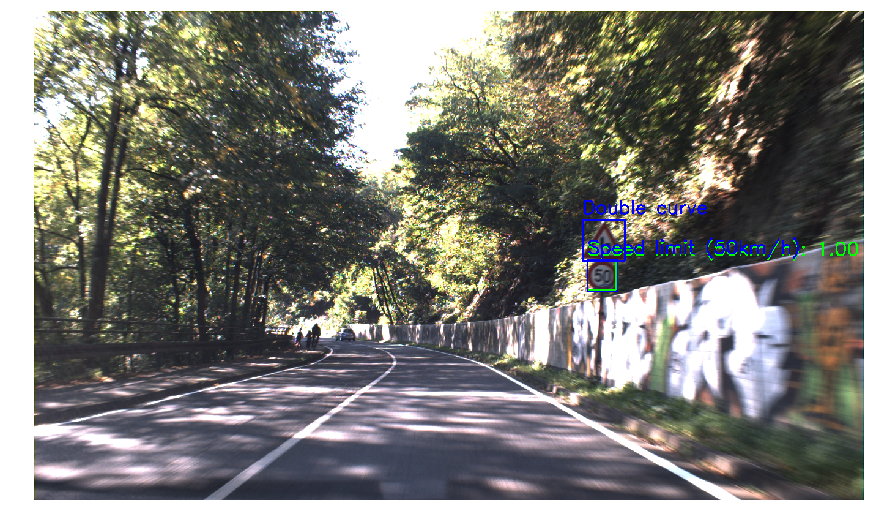

Roundabout mandatory: 0.14
Roundabout mandatory: 0.89


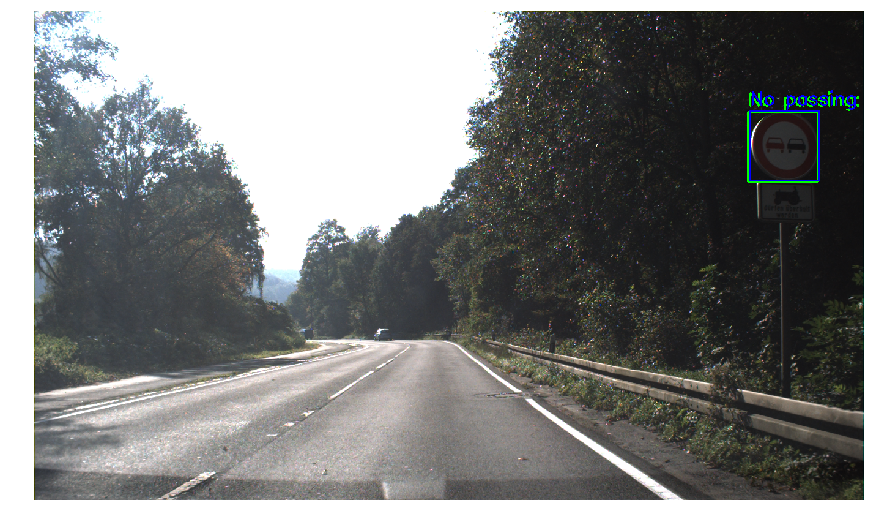

Yield: 0.10
Yield: 0.06
Roundabout mandatory: 0.44


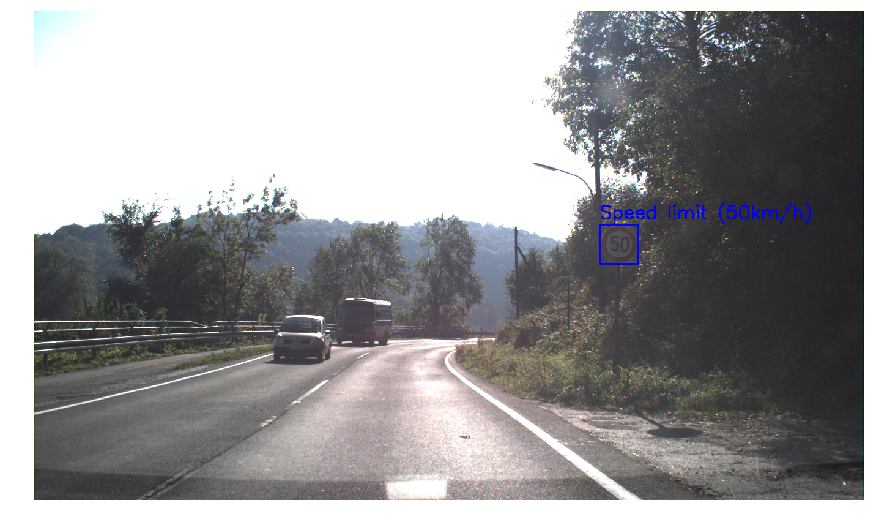

Roundabout mandatory: 0.15
Speed limit (30km/h): 0.08


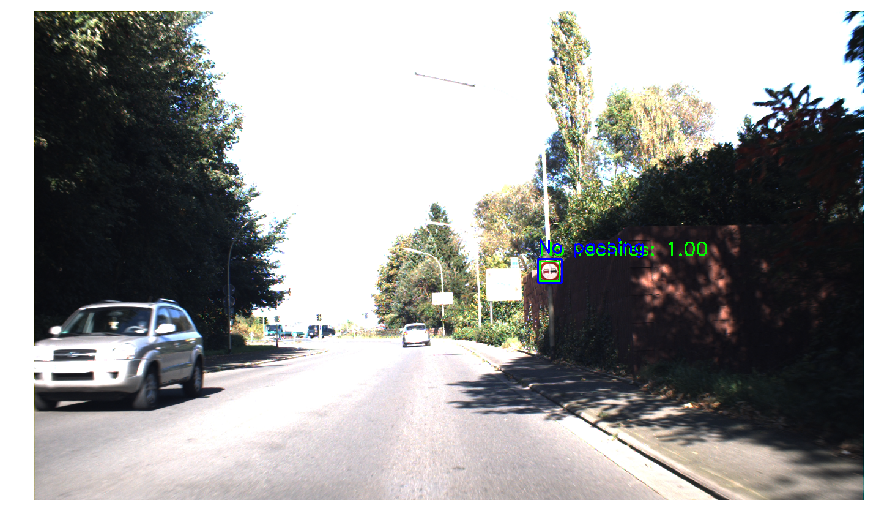

Yield: 0.19
Dangerous curve to the left: 0.17


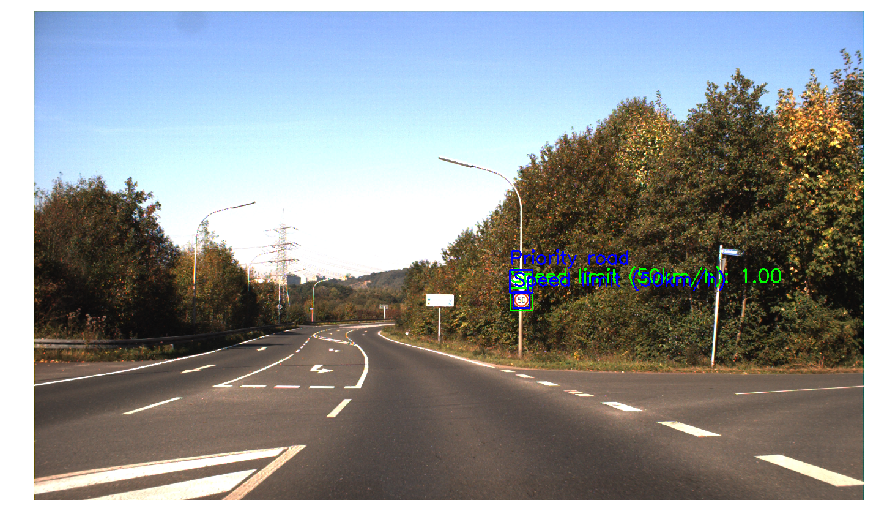

Yield: 0.10
Slippery road: 0.43


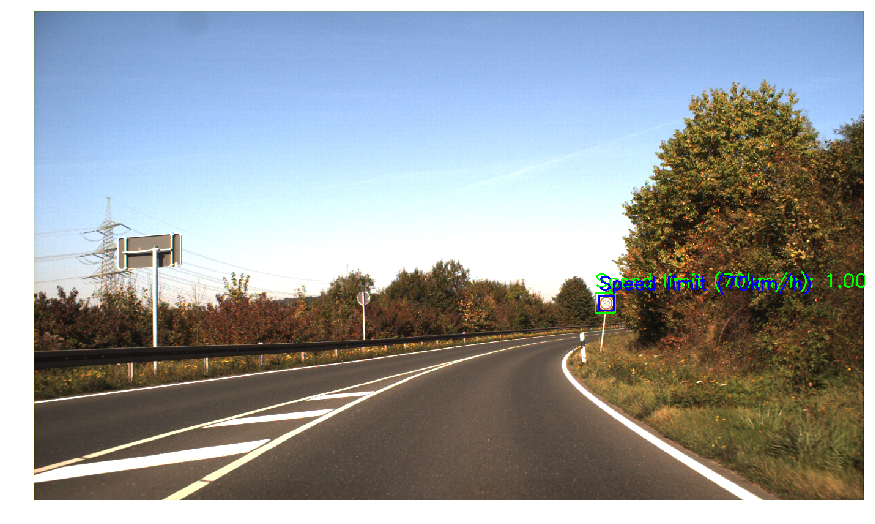

In [24]:
# Code snippet for drawing bounding boxes
for i, im in enumerate(images[:10]):
    if str(i) in gt_bboxes:
        detect_draw(model, im, gt_bboxes[str(i)])

In [ ]:
# Code snippet for evaluating detector
n_tp, n_pos = detect_mAP(model, images, gt_bboxes)
mAP = 0
for c in cir_cls:
    if n_pos[c] != 0:
        mAP += n_tp[c] / float(n_pos[c])
mAP = mAP / len(cir_cls)
print(mAP)

In [ ]:
# Code snippet for evaluating our drive-by tests
TARGET_LABEL = 9

images = read_images("./test_video/star_nopass_1/")
n_tg = 0
n_det = 0
for im in images:
    bboxes = detect(model, im)
    if len(bboxes) == 0:
        continue
    n_det += 1
    for bb in bboxes:
        if bb[4] == TARGET_LABEL:
            n_tg += 1
            break
print(float(n_tg) / n_det)        
print(float(n_det) / len(images))

---
### Test physical samples without detection

Feed in manually cropped images

In [ ]:
test = read_images("./test_attack_1/test_2")

/home/chawins/.conda/envs/tsa3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  
/home/chawins/.conda/envs/tsa3/lib/python3.6/site-packages/ipykernel_launcher.py:35: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


Speed limit (60km/h)
['Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Bumpy road', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)']


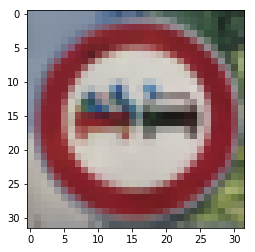

Speed limit (60km/h)
['Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Vechiles over 3.5 metric tons prohibited', 'Speed limit (60km/h)', 'Speed limit (60km/h)']


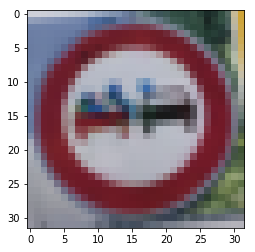

No passing
['No passing', 'No passing', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'No passing', 'No passing', 'Speed limit (60km/h)', 'No passing']


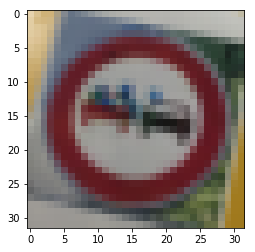

Turn right ahead
['Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead']


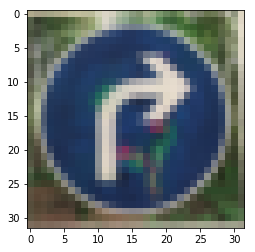

Turn right ahead
['Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'Turn right ahead', 'Go straight or right', 'Turn right ahead', 'Turn right ahead']


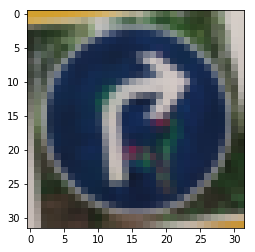

Turn right ahead
['Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'End of no passing']


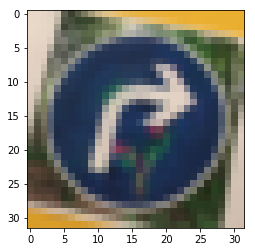

Speed limit (30km/h)
['Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)']


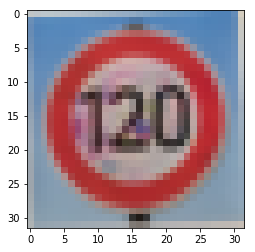

Speed limit (30km/h)
['Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)']


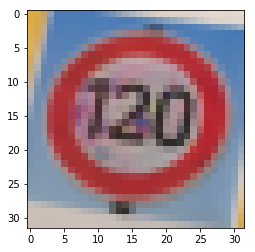

Speed limit (30km/h)
['Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (20km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)']


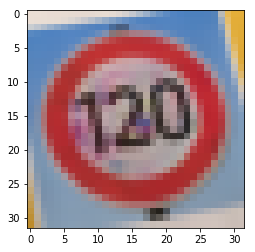

Yield
['Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'End of no passing', 'Yield', 'Yield', 'Yield', 'Yield']


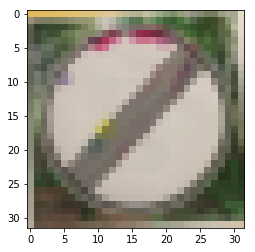

End of no passing
['End of no passing', 'End of no passing', 'End of no passing', 'Yield', 'End of no passing', 'End of no passing', 'End of no passing', 'End of no passing', 'End of no passing', 'End of no passing']


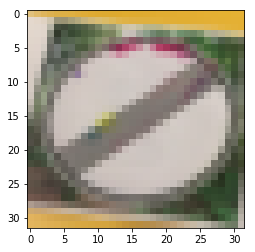

End of no passing
['End of no passing', 'End of no passing', 'End of all speed and passing limits', 'End of no passing', 'End of no passing', 'End of no passing', 'Yield', 'End of no passing', 'End of no passing', 'End of no passing']


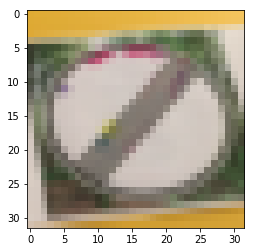

Stop
['Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop']


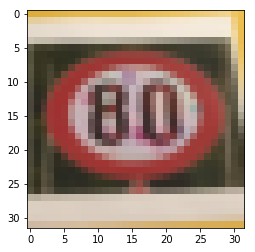

In [89]:
for i, im in enumerate(test):
    resized_im = resize(im, (32, 32), interp="bilinear")
    print(signnames[predict(model, resized_im)])
    test_tran(im, model)
    plt.imshow(resized_im)
    plt.show()

---
### Code to prepare original image

- Put background behind the schematic of a sign
(can also be done in other software like Inkscape)

In [33]:
def prepare_drawing(im, bg):
    
    pad = int(im.shape[0] / 10)
    hpad = int(pad / 2)
    height = im.shape[0] + pad
    width = im.shape[1] + pad
    new_im = np.zeros(shape=(height, width, im.shape[2]))
    new_im[hpad:height - hpad, hpad:width - hpad, :] = im
    
    mask = np.zeros(shape=(height, width, 1)) + 1
    mask[np.nonzero(new_im[:, :, 0])] = 0
    mask[200:500, 150:520, :] = 0
    
    bg = resize(bg, new_im.shape) / 255.
    new_im = new_im + mask * bg
    
    return new_im

In [44]:
im = read_image("./stop.png") / 255.
bg = read_image('./background.jpg') / 255.
tmp = prepare_drawing(im, bg)

In [45]:
tmp.shape

(660, 660, 3)

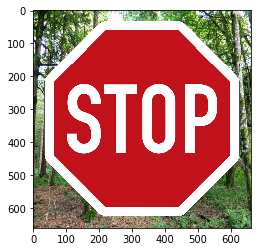

In [46]:
plt.imshow(tmp)
misc.imsave('test.png', tmp)

---
### Model trainer

In [11]:
# Build model
# model = built_mltscl()
model = build_cnn()

# Load dataset
x_train, y_train, x_val, y_val, x_test, y_test = load_dataset_GTSRB(
    n_channel=N_CHANNEL, train_file_name='train_extended_75.p')

y_train = keras.utils.to_categorical(y_train, NUM_LABELS)
y_test = keras.utils.to_categorical(y_test, NUM_LABELS)
y_val = keras.utils.to_categorical(y_val, NUM_LABELS)

In [12]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 32, 32, 32)        2432      
_________________________________________________________________
dropout_7 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 32, 32, 32)        25632     
_________________________________________________________________
dropout_8 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 16, 16, 64)        51264     
__________

In [13]:
filepath = './weights.{epoch:02d}-{val_loss:.2f}.hdf5'
modelCheckpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=0,
                                                  save_best_only=False, save_weights_only=False,
                                                  mode='auto', period=1)
earlyStop = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5,
                                          verbose=0, mode='auto')

In [14]:
model.fit(x_train, y_train, batch_size=BATCH_SIZE, epochs=NUM_EPOCH, verbose=1, 
          callbacks=[modelCheckpoint, earlyStop], validation_data=(x_val, y_val), 
          shuffle=True, initial_epoch=0)

Train on 695980 samples, validate on 4410 samples
Epoch 1/100
695980/695980 [==============================] - 251s - loss: 1.2923 - acc: 0.6274 - val_loss: 0.3096 - val_acc: 0.9311
Epoch 2/100
695980/695980 [==============================] - 253s - loss: 0.3372 - acc: 0.9177 - val_loss: 0.1985 - val_acc: 0.9628
Epoch 3/100
695980/695980 [==============================] - 253s - loss: 0.2063 - acc: 0.9591 - val_loss: 0.1925 - val_acc: 0.9646
Epoch 4/100
695980/695980 [==============================] - 252s - loss: 0.1573 - acc: 0.9727 - val_loss: 0.1819 - val_acc: 0.9726
Epoch 5/100
695980/695980 [==============================] - 253s - loss: 0.1299 - acc: 0.9791 - val_loss: 0.1405 - val_acc: 0.9796
Epoch 6/100
695980/695980 [==============================] - 252s - loss: 0.1115 - acc: 0.9828 - val_loss: 0.1491 - val_acc: 0.9771
Epoch 7/100
695980/695980 [==============================] - 252s - loss: 0.0980 - acc: 0.9853 - val_loss: 0.1596 - val_acc: 0.9805
Epoch 8/100
695980/695980 

KeyboardInterrupt: 